## PyGMTSAR SBAS Analysis: Imperial Valley, California, 2015

The PyGMTSAR InSAR library, Geomed3D Geophysical Inversion Library, N-Cube 3D/4D GIS Data Visualization, among others, are my open-source projects developed in my free time. I hold a Master's degree in STEM, specializing in radio physics. In 2004, I received the first prize in the All-Russian Physics Competition for significant results in forward and inverse modeling for nonlinear optics and holography. These skills are also applicable to modeling Gravity, Magnetic, and Thermal fields, as well as satellite interferometry processing. With 20 years of experience as a data scientist and software developer, I have contributed to scientific and industrial development, working on government contracts, university projects, and with companies like LG Corp and Google Inc.

You can support my work on [Patreon](https://www.patreon.com/pechnikov), where I share updates on my projects, publications, use cases, examples, and other useful information. For research and development services and support, please visit my profile on the freelance platform [Upwork](https://www.upwork.com).

### Resources
- Google Colab Pro notebooks and articles on [Patreon](https://www.patreon.com/pechnikov),
- Google Colab notebooks on [GitHub](https://github.com),
- Docker Images on [DockerHub](https://hub.docker.com),
- Geological Models on [YouTube](https://www.youtube.com),
- VR/AR Geological Models on [GitHub](https://github.com),
- Live updates and announcements on [LinkedIn](https://www.linkedin.com/in/alexey-pechnikov/).

© Alexey Pechnikov, 2024

$\large\color{blue}{\text{Hint: Use menu Cell} \to \text{Run All or Runtime} \to \text{Complete All or Runtime} \to \text{Run All}}$
$\large\color{blue}{\text{(depending of your localization settings) to execute the entire notebook}}$

## Load Modules to Check Environment

In [1]:
import platform, sys, os

## Google Colab Installation

### Install GMTSAR
https://github.com/gmtsar/gmtsar

In [2]:
if 'google.colab' in sys.modules:
    count = !ls /usr/local | grep GMTSAR | wc -l
    if count == ['0']:
        !export DEBIAN_FRONTEND=noninteractive
        !apt-get update > /dev/null
        !apt install -y csh autoconf gfortran \
            libtiff5-dev libhdf5-dev liblapack-dev libgmt-dev gmt > /dev/null
        # GMTSAR codes are not so good to be compiled by modern GCC
        !apt install gcc-9 > /dev/null
        !update-alternatives --install /usr/bin/gcc gcc /usr/bin/gcc-9 10
        !update-alternatives --config gcc
        !gcc --version | head -n 1
        !rm -fr /usr/local/GMTSAR
        !git config --global advice.detachedHead false
        !cd /usr/local && git clone -q --branch master https://github.com/gmtsar/gmtsar GMTSAR
        # revert recent broken commit
        !cd /usr/local/GMTSAR && git checkout e98ebc0f4164939a4780b1534bac186924d7c998 > /dev/null
        !cd /usr/local/GMTSAR && autoconf > /dev/null
        !cd /usr/local/GMTSAR && ./configure --with-orbits-dir=/tmp > /dev/null
        !cd /usr/local/GMTSAR && make 1>/dev/null 2>/dev/null
        !cd /usr/local/GMTSAR && make install >/dev/null
        # fix for missed script, use bash instead of csh interpretator
        # note: csh messes stdout and stderr in Docker environment, it's resolved in PyGMTSAR code
        !echo '#!/bin/sh' > /usr/local/GMTSAR/bin/gmtsar_sharedir.csh
        !echo echo /usr/local/GMTSAR/share/gmtsar >> /usr/local/GMTSAR/bin/gmtsar_sharedir.csh
        !chmod a+x /usr/local/GMTSAR/bin/gmtsar_sharedir.csh
        !/usr/local/GMTSAR/bin/gmtsar_sharedir.csh
        # test one GMTSAR binary
        !/usr/local/GMTSAR/bin/make_s1a_tops 2>&1 | head -n 2





update-alternatives: using /usr/bin/gcc-9 to provide /usr/bin/gcc (gcc) in auto mode
There is only one alternative in link group gcc (providing /usr/bin/gcc): /usr/bin/gcc-9
Nothing to configure.
gcc (Ubuntu 9.5.0-1ubuntu1~22.04) 9.5.0
HEAD is now at e98ebc0 extending solid_tide to 2050 as leap seconds are abandoned hopefully
/usr/local/GMTSAR/share/gmtsar
 
Usage: make_slc_s1a_tops xml_file tiff_file output mode dr.grd da.grd


In [3]:
import sys
if 'google.colab' in sys.modules:
    !apt install -y xvfb > /dev/null
    !{sys.executable} -m pip install pyvista xvfbwrapper > /dev/null
    import xvfbwrapper
    display = xvfbwrapper.Xvfb(width=800, height=600)
    display.start()

### Define ENV Variables for Jupyter Instance

In [4]:
# use default GMTSAR installation path
PATH = os.environ['PATH']
if PATH.find('GMTSAR') == -1:
    PATH = os.environ['PATH'] + ':/usr/local/GMTSAR/bin/'
    %env PATH {PATH}

env: PATH=/opt/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin:/usr/local/GMTSAR/bin/


### Install Python Modules

Maybe you need to restart your notebook, follow the instructions printing below.

The installation takes a long time on fresh Debian 10 and a short time on Google Colab

In [5]:
!{sys.executable} --version

Python 3.10.12


In [6]:
if 'google.colab' in sys.modules:
    #!{sys.executable} -m pip install -q git+https://github.com/mobigroup/gmtsar.git@pygmtsar2#subdirectory=pygmtsar
    !{sys.executable} -m pip install -q pygmtsar
from pygmtsar import __version__
__version__

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.3/170.3 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 53.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 49.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.7/53.7 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.3/90.3 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 60.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 55.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 58.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 48.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 51.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

'2024.3.15.post4'

## Load and Setup Python Modules

In [7]:
import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
from dask.distributed import Client
import dask
import warnings

In [8]:
# plotting modules
import pyvista as pv
# magic trick for white background
pv.set_plot_theme("document")
import panel
panel.extension('vtk')
from contextlib import contextmanager
import matplotlib.pyplot as plt
@contextmanager
def mpl_settings(settings):
    original_settings = {k: plt.rcParams[k] for k in settings}
    plt.rcParams.update(settings)
    yield
    plt.rcParams.update(original_settings)
plt.rcParams['figure.figsize'] = [12, 4]
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.titlesize'] = 24
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
%matplotlib inline

In [9]:
from pygmtsar import S1, Stack, tqdm_dask, ASF, ESA, Tiles

## Define Sentinel-1 SLC Scenes and Processing Parameters

In [10]:
SCENES = ['S1A_IW_SLC__1SSV_20150121T134412_20150121T134426_004270_005317_DBBE',
          'S1A_IW_SLC__1SSV_20150310T134411_20150310T134426_004970_006386_36B8',
          'S1A_IW_SLC__1SSV_20150403T134412_20150403T134426_005320_006BC4_3A7A',
          'S1A_IW_SLC__1SSV_20150427T134413_20150427T134428_005670_00745C_C1D8',
          'S1A_IW_SLC__1SSV_20150521T134415_20150521T134429_006020_007C3F_13DD']
SUBSWATH = 1
POLARIZATION = 'VV'

In [11]:
REFERENCE    = '2015-04-03'
WORKDIR      = 'raw_imperial'
DATADIR      = 'data_imperial'
BASEDAYS     = 100
BASEMETERS   = 150

In [12]:
# define DEM filename inside data directory
DEM = f'{DATADIR}/dem.nc'

## Download and Unpack Datasets

## Enter Your ASF and ESA User and Password

If the data directory is empty or doesn't exist, you'll need to download Sentinel-1 scenes from the Alaska Satellite Facility (ASF) datastore. Use your Earthdata Login credentials. If you don't have an Earthdata Login, you can create one at https://urs.earthdata.nasa.gov//users/new Also, register your ESA Copernicus datastore account at https://dataspace.copernicus.eu/

You can also use pre-existing SLC scenes stored on your Google Drive, or you can copy them using a direct public link from iCloud Drive.

The credentials below are available at the time the notebook is validated.

In [13]:
# Set these variables to None and you will be prompted to enter your username and password below.
asf_username = 'GoogleColab2023'
asf_password = 'GoogleColab_2023'

esa_username = 'sifts0_spangle@icloud.com'
esa_password = 'cnjwdchuwe&e9d0We9'

In [14]:
# Set these variables to None and you will be prompted to enter your username and password below.
asf = ASF(asf_username, asf_password)
# Optimized scene downloading from ASF - only the required subswaths and polarizations.
print(asf.download_scenes(DATADIR, SCENES, SUBSWATH))
# There are two ways to download orbits; you can use any one or both together.
try:
    # RESORB orbit downloading from ASF has recently failed.
    print(asf.download_orbits(DATADIR))
except Exception as e:
    print (e)
    # Download missed orbits in case ASF orbit downloading fails.
    esa = ESA(esa_username, esa_password)
    print (esa.download_orbits(DATADIR))

ASF Downloading Sentinel-1 SLC:   0%|          | 0/5 [00:00<?, ?it/s]

                                               scene
0  S1A_IW_SLC__1SSV_20150121T134412_20150121T1344...
1  S1A_IW_SLC__1SSV_20150310T134411_20150310T1344...
2  S1A_IW_SLC__1SSV_20150403T134412_20150403T1344...
3  S1A_IW_SLC__1SSV_20150427T134413_20150427T1344...
4  S1A_IW_SLC__1SSV_20150521T134415_20150521T1344...


ASF Downloading POEORB Orbits:   0%|          | 0/5 [00:00<?, ?it/s]

0    S1A_OPER_AUX_POEORB_OPOD_20210305T143838_V2015...
1    S1A_OPER_AUX_POEORB_OPOD_20210306T054130_V2015...
2    S1A_OPER_AUX_POEORB_OPOD_20210306T133136_V2015...
3    S1A_OPER_AUX_POEORB_OPOD_20210306T211838_V2015...
4    S1A_OPER_AUX_POEORB_OPOD_20210307T050740_V2015...
dtype: object


In [15]:
# define AOI as the whole scenes area
AOI = S1.scan_slc(DATADIR)
# download Copernicus Global DEM 1 arc-second
Tiles().download_dem(AOI, filename=DEM)

Tiles Parallel Downloading:   0%|          | 0/4 [00:00<?, ?it/s]

<xarray.DataArray (lat: 3060, lon: 3977)> Size: 49MB
array([[860.321   , 855.2291  , 850.85474 , ...,  31.964685,  32.147163,
         33.197975],
       [843.7136  , 837.49274 , 832.5472  , ...,  32.485516,  32.543926,
         32.510815],
       [826.5994  , 819.5655  , 814.8217  , ...,  32.654087,  32.851753,
         32.536045],
       ...,
       [-11.820954, -12.024645, -12.330568, ...,  41.315605,  40.720936,
         40.691956],
       [-12.049346, -12.105479, -12.494249, ...,  41.34438 ,  40.677773,
         40.43251 ],
       [-12.367791, -12.577968, -12.3896  , ...,  41.086136,  40.689472,
         40.623554]], dtype=float32)
Coordinates:
  * lon      (lon) float64 32kB -115.7 -115.7 -115.7 ... -114.6 -114.6 -114.6
  * lat      (lat) float64 24kB 31.92 31.92 31.92 31.92 ... 32.77 32.77 32.77
Attributes:
    AREA_OR_POINT:  Point
    scale_factor:   1.0
    add_offset:     0.0

## Run Local Dask Cluster

Launch Dask cluster for local and distributed multicore computing. That's possible to process terabyte scale Sentinel-1 SLC datasets on Apple Air 16 GB RAM.

In [16]:
# simple Dask initialization
if 'client' in globals():
    client.close()
client = Client()
client

INFO:distributed.http.proxy:To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
INFO:distributed.scheduler:State start
INFO:distributed.scheduler:  Scheduler at:     tcp://127.0.0.1:36659
INFO:distributed.scheduler:  dashboard at:  http://127.0.0.1:8787/status
INFO:distributed.scheduler:Registering Worker plugin shuffle
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:32893'
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:44863'
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:46685'
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:43141'
INFO:distributed.scheduler:Register worker <WorkerState 'tcp://127.0.0.1:41189', name: 1, status: init, memory: 0, processing: 0>
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:41189
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:40108
INFO:distributed.scheduler:Regist

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 8,Total memory: 50.99 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:36659,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 8
Started: Just now,Total memory: 50.99 GiB
Comm: tcp://127.0.0.1:38025,Total threads: 2
Dashboard: http://127.0.0.1:39835/status,Memory: 12.75 GiB
Nanny: tcp://127.0.0.1:32893,


## Init

Search recursively for measurement (.tiff) and annotation (.xml) and orbit (.EOF) files in the DATA directory. It can be directory with full unzipped scenes (.SAFE) subdirectories or just a directory with the list of pairs of required .tiff and .xml files (maybe pre-filtered for orbit, polarization and subswath to save disk space). If orbit files and DEM are missed these will be downloaded automatically below.

In [17]:
scenes = S1.scan_slc(DATADIR)
scenes

,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2015-01-21,2015-01-21 13:44:13,D,S1A,VV,1,data_imperial/S1A_IW_SLC__1SSV_20150121T134412...,data_imperial/S1A_IW_SLC__1SSV_20150121T134412...,data_imperial/S1A_OPER_AUX_POEORB_OPOD_2021030...,"MULTIPOLYGON (((-114.64126 32.61710, -114.6924..."
2015-03-10,2015-03-10 13:44:12,D,S1A,VV,1,data_imperial/S1A_IW_SLC__1SSV_20150310T134411...,data_imperial/S1A_IW_SLC__1SSV_20150310T134411...,data_imperial/S1A_OPER_AUX_POEORB_OPOD_2021030...,"MULTIPOLYGON (((-114.64096 32.61768, -114.6921..."
2015-04-03,2015-04-03 13:44:13,D,S1A,VV,1,data_imperial/S1A_IW_SLC__1SSV_20150403T134412...,data_imperial/S1A_IW_SLC__1SSV_20150403T134412...,data_imperial/S1A_OPER_AUX_POEORB_OPOD_2021030...,"MULTIPOLYGON (((-114.64328 32.60917, -114.6944..."
2015-04-27,2015-04-27 13:44:14,D,S1A,VV,1,data_imperial/S1A_IW_SLC__1SSV_20150427T134413...,data_imperial/S1A_IW_SLC__1SSV_20150427T134413...,data_imperial/S1A_OPER_AUX_POEORB_OPOD_2021030...,"MULTIPOLYGON (((-114.64313 32.60789, -114.6943..."
2015-05-21,2015-05-21 13:44:15,D,S1A,VV,1,data_imperial/S1A_IW_SLC__1SSV_20150521T134415...,data_imperial/S1A_IW_SLC__1SSV_20150521T134415...,data_imperial/S1A_OPER_AUX_POEORB_OPOD_2021030...,"MULTIPOLYGON (((-114.64230 32.60788, -114.6934..."


In [18]:
sbas = Stack(WORKDIR, drop_if_exists=True).set_scenes(scenes).set_reference(REFERENCE)
sbas.to_dataframe()

NOTE: auto set reference scene 2015-01-21. You can change it like Stack.set_reference("2022-01-20")


,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2015-01-21,2015-01-21 13:44:13,D,S1A,VV,1,data_imperial/S1A_IW_SLC__1SSV_20150121T134412...,data_imperial/S1A_IW_SLC__1SSV_20150121T134412...,data_imperial/S1A_OPER_AUX_POEORB_OPOD_2021030...,"MULTIPOLYGON (((-114.64126 32.61710, -114.6924..."
2015-03-10,2015-03-10 13:44:12,D,S1A,VV,1,data_imperial/S1A_IW_SLC__1SSV_20150310T134411...,data_imperial/S1A_IW_SLC__1SSV_20150310T134411...,data_imperial/S1A_OPER_AUX_POEORB_OPOD_2021030...,"MULTIPOLYGON (((-114.64096 32.61768, -114.6921..."
2015-04-03,2015-04-03 13:44:13,D,S1A,VV,1,data_imperial/S1A_IW_SLC__1SSV_20150403T134412...,data_imperial/S1A_IW_SLC__1SSV_20150403T134412...,data_imperial/S1A_OPER_AUX_POEORB_OPOD_2021030...,"MULTIPOLYGON (((-114.64328 32.60917, -114.6944..."
2015-04-27,2015-04-27 13:44:14,D,S1A,VV,1,data_imperial/S1A_IW_SLC__1SSV_20150427T134413...,data_imperial/S1A_IW_SLC__1SSV_20150427T134413...,data_imperial/S1A_OPER_AUX_POEORB_OPOD_2021030...,"MULTIPOLYGON (((-114.64313 32.60789, -114.6943..."
2015-05-21,2015-05-21 13:44:15,D,S1A,VV,1,data_imperial/S1A_IW_SLC__1SSV_20150521T134415...,data_imperial/S1A_IW_SLC__1SSV_20150521T134415...,data_imperial/S1A_OPER_AUX_POEORB_OPOD_2021030...,"MULTIPOLYGON (((-114.64230 32.60788, -114.6934..."


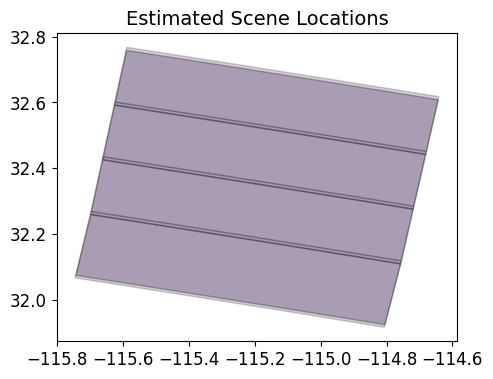

In [19]:
sbas.plot_scenes()

### Load DEM

The function below loads DEM from file or Xarray variable and converts heights to ellipsoidal model using EGM96 grid.

In [20]:
# define the area of interest (AOI) to speedup the processing
sbas.load_dem(DEM, AOI)

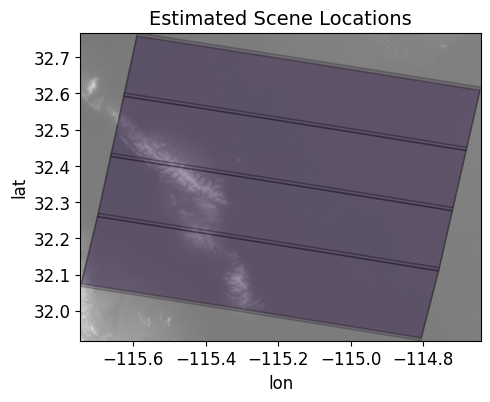

In [21]:
sbas.plot_scenes()
plt.savefig('Estimated Scene Locations.jpg')

## Align a Stack of Images

In [22]:
if os.path.exists('/.dockerenv') and not 'google.colab' in sys.modules:
    # use special joblib backend in Docker containers
    sbas.compute_align(joblib_aligning_backend='threading')
else:
    sbas.compute_align()

Aligning Reference:   0%|          | 0/1 [00:00<?, ?it/s]

Aligning Repeat:   0%|          | 0/4 [00:00<?, ?it/s]

Convert Subswath:   0%|          | 0/5 [00:00<?, ?it/s]

## SBAS Baseline

In [23]:
baseline_pairs = sbas.baseline_pairs(days=BASEDAYS, meters=BASEMETERS)
baseline_pairs

Note: function baseline_pairs() renamed to sbas_pairs(). Use separate filtering functions when needed.


,ref,rep,ref_baseline,rep_baseline,pair,baseline,duration,rel
0,2015-01-21,2015-03-10,52.62,-37.72,2015-01-21 2015-03-10,-90.34,48,NaT
1,2015-01-21,2015-04-03,52.62,-0.00,2015-01-21 2015-04-03,-52.62,72,NaT
2,2015-01-21,2015-04-27,52.62,-30.43,2015-01-21 2015-04-27,-83.05,96,NaT
3,2015-03-10,2015-04-03,-37.72,-0.00,2015-03-10 2015-04-03,37.72,24,NaT
4,2015-03-10,2015-04-27,-37.72,-30.43,2015-03-10 2015-04-27,7.29,48,NaT
5,2015-03-10,2015-05-21,-37.72,-50.96,2015-03-10 2015-05-21,-13.24,72,NaT
6,2015-04-03,2015-04-27,-0.00,-30.43,2015-04-03 2015-04-27,-30.43,24,NaT
7,2015-04-03,2015-05-21,-0.00,-50.96,2015-04-03 2015-05-21,-50.96,48,NaT
8,2015-04-27,2015-05-21,-30.43,-50.96,2015-04-27 2015-05-21,-20.53,24,NaT


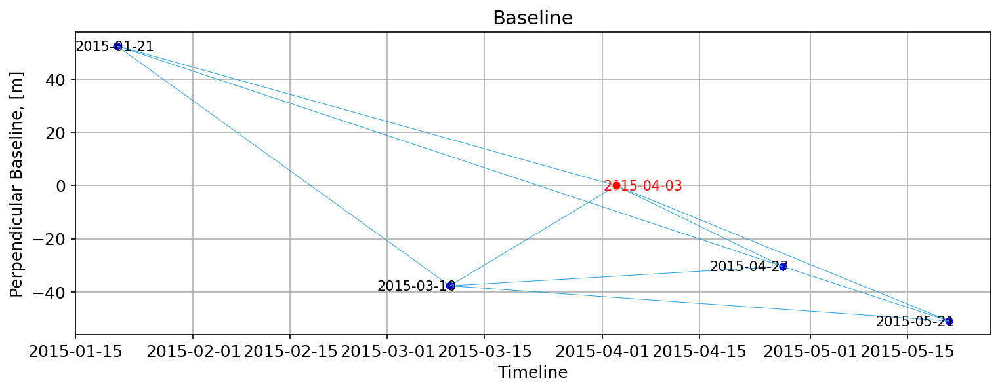

In [24]:
with mpl_settings({'figure.dpi': 150}):
    sbas.plot_baseline(baseline_pairs)
plt.savefig('Baseline.jpg')

## Geocoding

In [25]:
# use default 60m coordinates grid
sbas.compute_geocode()

Radar Transform Computing:   0%|          | 0/1 [00:00<?, ?it/s]

Radar Transform Saving:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

INFO:distributed.scheduler:Receive client connection: Client-worker-96dbde50-e456-11ee-ad20-0242ac1c000c
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:58850
INFO:distributed.scheduler:Receive client connection: Client-worker-96dc4282-e456-11ee-ad24-0242ac1c000c
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:58856
INFO:distributed.scheduler:Receive client connection: Client-worker-96dca130-e456-11ee-ad28-0242ac1c000c
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:58868


Radar Transform Indexing:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Radar Inverse Transform Computing:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

INFO:distributed.scheduler:Receive client connection: Client-worker-9860bfae-e456-11ee-ad2c-0242ac1c000c
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:58898


Satellite Look Vector Computing:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

### DEM in Radar Coordinates

The grids are NetCDF files processing as xarray DataArrays.

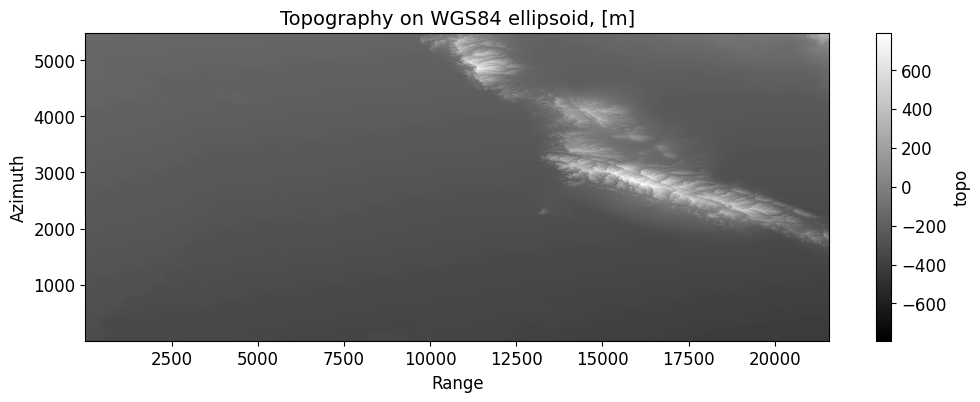

In [26]:
sbas.plot_topo()
plt.savefig('Topography on WGS84 ellipsoid, [m].jpg')

## Interferograms

Define a single interferogram or a SBAS series. Make direct and reverse interferograms (from past to future or from future to past).

Decimation is useful to save disk space. Geocoding results are always produced on the provided DEM grid so the output grid and resolution are the same to the DEM. By this way, ascending and descending orbit results are always defined on the same grid by design. An internal processing cell is about 30 x 30 meters size and for default output 60m resolution (like to GMTSAR and GAMMA software) decimation 2x2 is reasonable. For the default wavelength=200 for Gaussian filter 1/4 of wavelength is approximately equal to ~60 meters and better resolution is mostly useless (while it can be used for small objects detection). For wavelength=400 meters use 90m DEM resolution with decimation 4x4.

The grids are NetCDF files processing as xarray DataArrays.

In [27]:
pairs = baseline_pairs[['ref', 'rep']]
pairs

,ref,rep
0,2015-01-21,2015-03-10
1,2015-01-21,2015-04-03
2,2015-01-21,2015-04-27
3,2015-03-10,2015-04-03
4,2015-03-10,2015-04-27
5,2015-03-10,2015-05-21
6,2015-04-03,2015-04-27
7,2015-04-03,2015-05-21
8,2015-04-27,2015-05-21


In [28]:
# load Sentinel-1 data
data = sbas.open_data()

In [29]:
# Gaussian filtering 400m cut-off wavelength with multilooking 1x4 on Sentinel-1 intensity
intensity = sbas.multilooking(np.square(np.abs(data)), wavelength=400, coarsen=(1,4))

In [30]:
phase = sbas.multilooking(sbas.phasediff(pairs), wavelength=400, coarsen=(1,4))

In [31]:
corr = sbas.correlation(phase, intensity)

In [32]:
# Goldstein filter expects square grid cells produced using multilooking
intf_filt = sbas.interferogram(sbas.goldstein(phase, corr, 32))

In [33]:
# use default 60m resolution
decimator = sbas.decimator()

In [34]:
# compute together because correlation depends on phase, and filtered phase depends on correlation.
tqdm_dask(result := dask.persist(decimator(corr), decimator(intf_filt)), desc='Compute Phase and Correlation')
# unpack results
corr60m, intf60m = result
#11954/11954 [02:30<00:00, 17.81it/s]

Compute Phase and Correlation:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

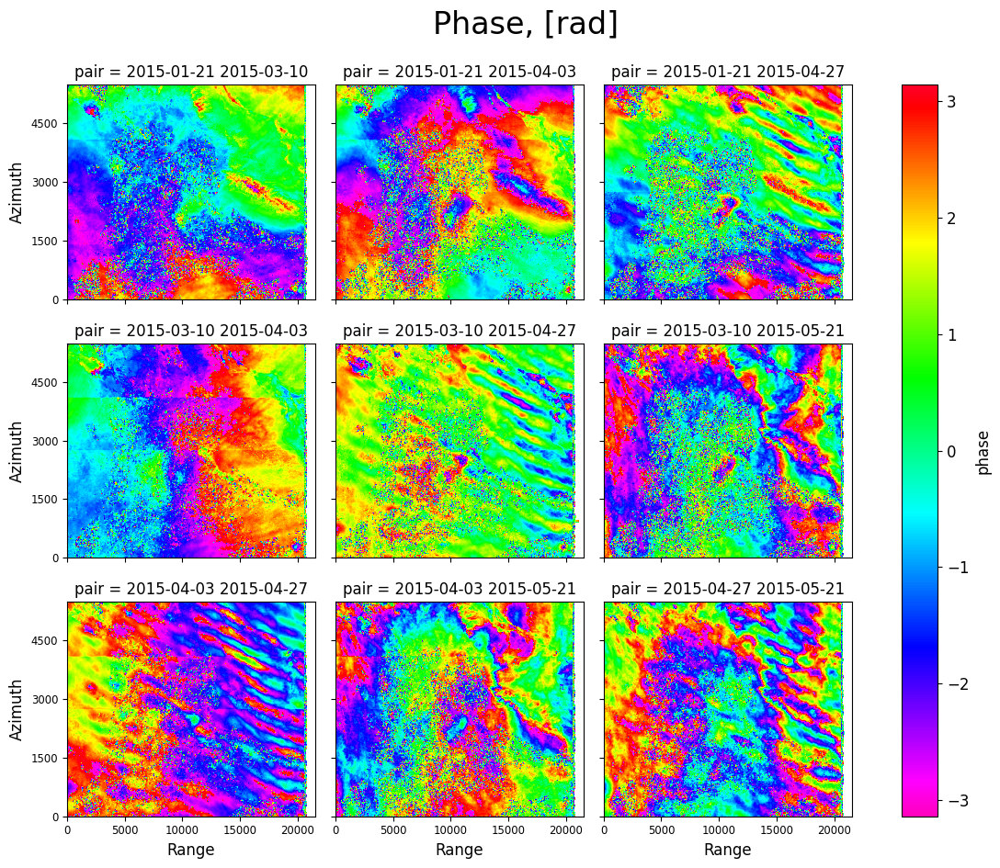

In [35]:
sbas.plot_interferograms(intf60m, cols=3, size=3, caption='Phase, [rad]')
plt.savefig('Phase, [rad].jpg')

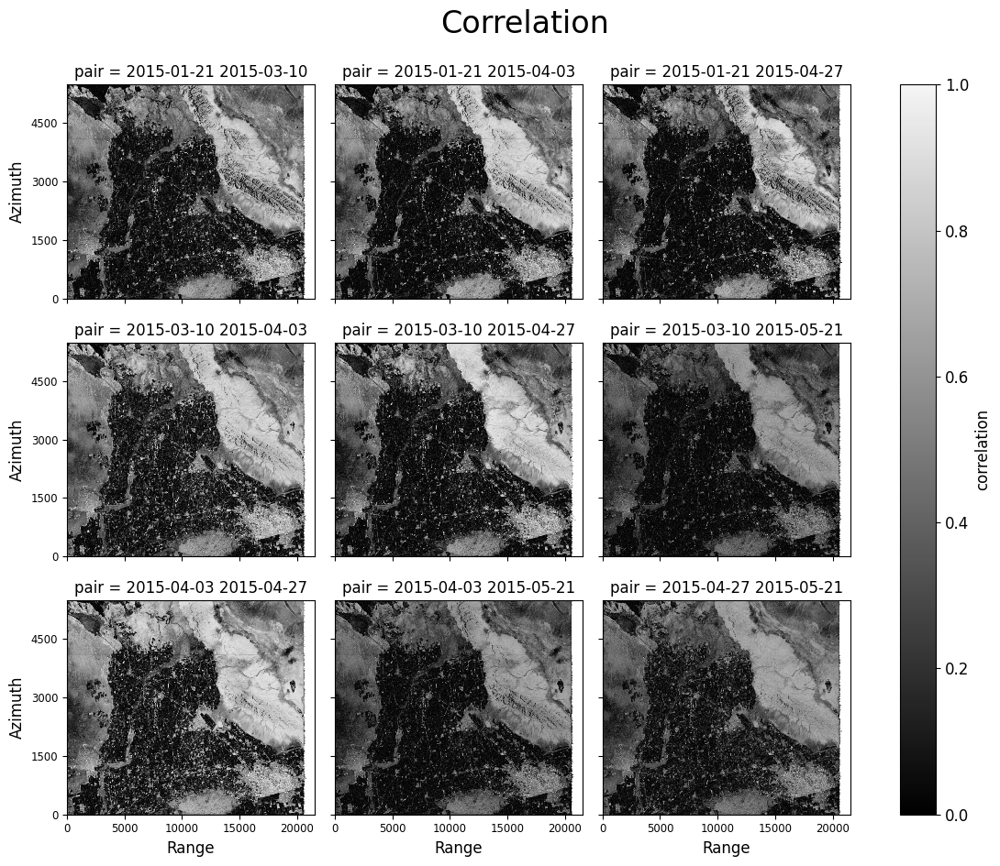

In [36]:
sbas.plot_correlations(corr60m, cols=3, size=3, caption='Correlation')
plt.savefig('Correlation.jpg')

## Unwrapping

Unwrapping process requires a lot of RAM and that's really RAM consuming when a lot of parallel proccesses running togeter. To limit the parallel processing tasks apply argument "n_jobs". The default value n_jobs=-1 means all the processor cores van be used. Also, use interferogram decimation above to produce smaller interferograms. And in addition a custom SNAPHU configuration can reduce RAM usage as explained below.

Attention: in case of crash on MacOS Apple Silicon run Jupyter as

`OBJC_DISABLE_INITIALIZE_FORK_SAFETY=YES no_proxy='*' jupyter notebook`

In [37]:
CORRLIMIT = 0.075
tqdm_dask(unwrap := sbas.unwrap_snaphu(intf60m, corr60m.where(corr60m>=CORRLIMIT)).persist(),
          desc='SNAPHU Unwrapping')

SNAPHU Unwrapping:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

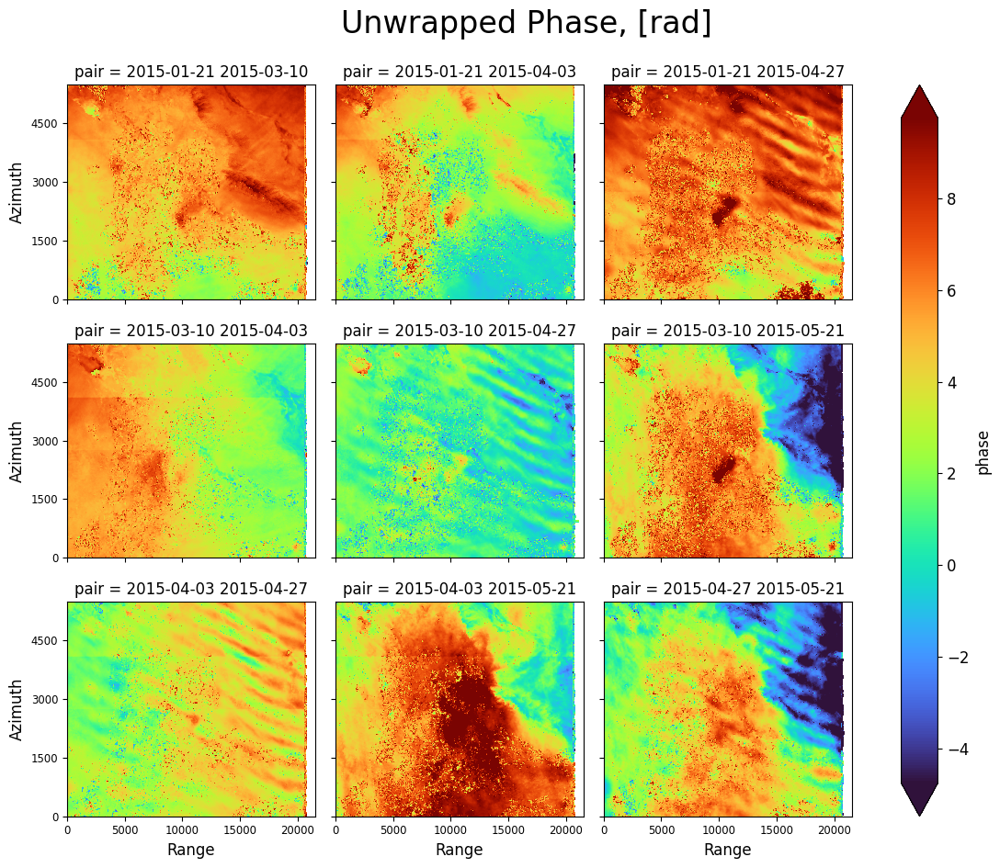

In [38]:
sbas.plot_phases(unwrap.phase, cols=3, size=3, caption='Unwrapped Phase, [rad]', quantile=[0.01, 0.99])
plt.savefig('Unwrapped Phase, [rad].jpg')

In [39]:
tqdm_dask(unwrap_ll := sbas.ra2ll(unwrap.phase).persist(), desc='Geocoding')

Geocoding:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

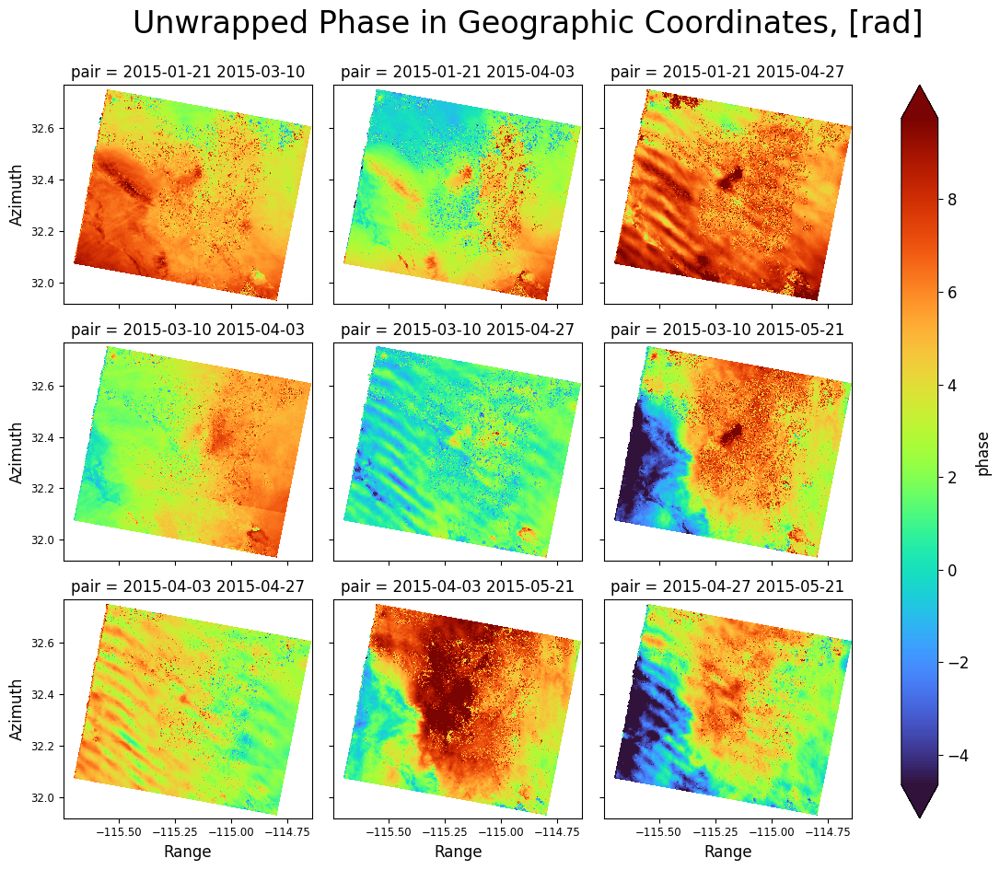

In [40]:
sbas.plot_phases(unwrap_ll, cols=3, size=3, caption='Unwrapped Phase in Geographic Coordinates, [rad]', quantile=[0.01, 0.99])
plt.savefig('Unwrapped Phase in Geographic Coordinates, [rad].jpg')

### Detrend Unwrapped Phase

Remove trend and apply gaussian filter to fix ionospheric effects and solid Earh's tides.

In [41]:
tqdm_dask(detrend := (unwrap.phase - sbas.gaussian(unwrap.phase, wavelength=60000)).persist(), desc='Detrending')

Detrending:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

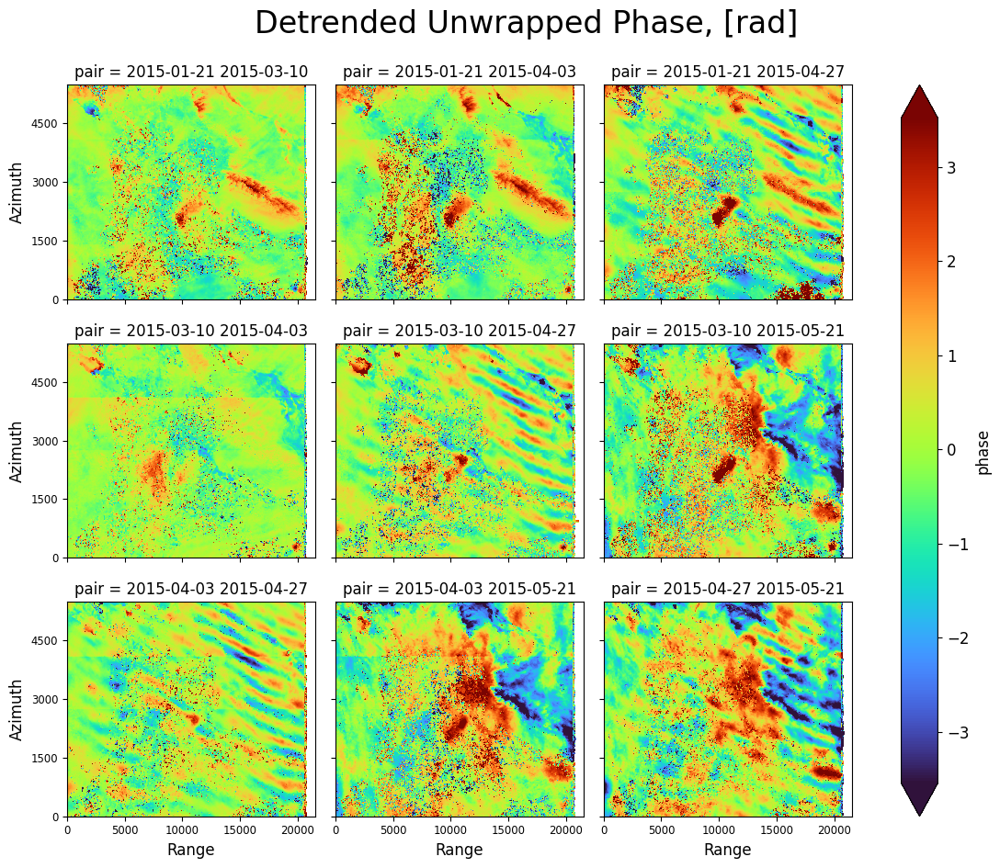

In [42]:
sbas.plot_phases(detrend, cols=3, size=3, caption='Detrended Unwrapped Phase, [rad]', quantile=[0.01, 0.99])
plt.savefig('Detrended Unwrapped Phase, [rad].jpg')

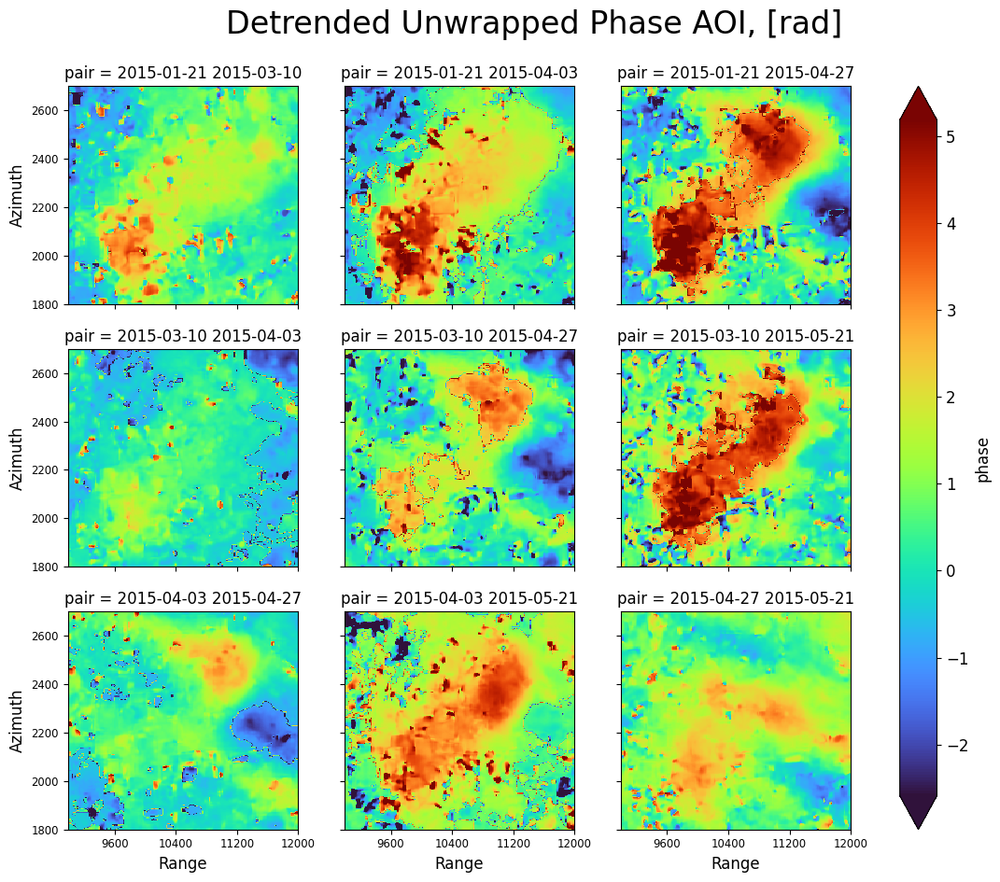

In [43]:
detrend_subset = detrend.sel(x=slice(9000,12000), y=slice(1800,2700))
sbas.plot_phases(detrend_subset, cols=3, size=3, caption='Detrended Unwrapped Phase AOI, [rad]', quantile=[0.01, 0.99])
plt.savefig('Detrended Unwrapped Phase AOI, [rad].jpg')

### Calculate Displacement Using Coherence-Weighted Least-Squares Solution

In [ ]:
# calculate phase displacement in radians and convert to LOS displacement in millimeter
tqdm_dask(disp := sbas.los_displacement_mm(sbas.lstsq(detrend, corr60m)).persist(), desc='SBAS Computing')
# clean 1st zero-filled displacement map for better visualization
disp[0] = np.nan

In [ ]:
sbas.plot_displacements(disp, cols=3, size=3, caption='Cumulative LOS Displacement, [mm]', quantile=[0.01, 0.99])
plt.savefig('Cumulative LOS Displacement, [mm].jpg')

In [ ]:
disp_subset = disp.sel(x=slice(9000,12000), y=slice(1800,2700))
sbas.plot_displacements(disp_subset, cols=3, size=3, caption='Cumulative LOS Displacement AOI, [mm]', quantile=[0.01, 0.99])
plt.savefig('Cumulative LOS Displacement AOI, [mm].jpg')

In [ ]:
# geocode subset on the full interferogram grid and crop a valid area only
tqdm_dask(disp_subset_ll := sbas.cropna(sbas.ra2ll(disp.sel(x=slice(9000,12000), y=slice(1800,2700)))).persist(),
          desc='SBAS Computing')

In [ ]:
sbas.plot_displacements(disp_subset_ll, cols=3, size=3, caption='Cumulative LOS Displacement in Geographic Coordinates AOI, [mm]',
                        quantile=[0.01, 0.99])
plt.savefig('Cumulative LOS Displacement Geographic Coordinates AOI, [mm].jpg')

## Pixel Displacement

In [ ]:
# define point coordinates
lat = 32.43
lon = -115.15

# find nearest pixel to the defined coordinates
# first zero replaced by NaN so convert it back to zero
disp_ll_pixel = sbas.ra2ll(disp_subset).sel(lat=lat, lon=lon, method='nearest').fillna(0)

In [ ]:
disp_ll_pixel.plot.scatter('date')
disp_ll_pixel.plot(lw=0.25)
plt.title(f'Cumulative LOS Displacement, [mm]\nlat={lat}, lon={lon}', fontsize=18)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Displacement, [mm]', fontsize=16)
plt.grid()
plt.savefig('Cumulative LOS Displacement POI, [mm].jpg')

## 3D Interactive Maps

In [ ]:
sbas.export_vtk(disp_subset_ll, 'disp_subset', mask='auto')

In [55]:
# build interactive 3D plot
def load_mesh(plotter, index, offset=None):
    vtk_grid = pv.read(f'disp_subset.{index}.vtk')
    if offset:
        vtk_grid.points[:, 2] += offset
    vtk_grid = vtk_grid.scale([1, 1, 0.0002], inplace=True)
    plotter.add_mesh(vtk_grid, scalars='los', cmap='turbo', clim=(-30,10), opacity=0.5, ambient=0.5, label=str(index))

plotter = pv.Plotter(notebook=True)
load_mesh(plotter, 1, 0)
load_mesh(plotter, 2, 200)
load_mesh(plotter, 3, 400)
load_mesh(plotter, 4, 600)
plotter.show_axes()
plotter.show(screenshot='3D LOS Displacements Stack.png', jupyter_backend='panel', return_viewer=True)
plotter.add_title(f'Interactive LOS Displacements on DEM', font_size=32)
plotter._on_first_render_request()
panel.panel(
    plotter.render_window, orientation_widget=plotter.renderer.axes_enabled,
    enable_keybindings=False, sizing_mode='stretch_width', min_height=600
)

VTKRenderWindowSynchronized(vtkXOpenGLRenderWindow, color_mappers=[LinearColorMapper(id='8fc...], min_height=600, orientation_widget=True, sizing_mode='stretch_width')

In [54]:
plotter = pv.Plotter(shape=(2, 2), notebook=True)

def load_mesh(plotter, index):
    vtk_grid = pv.read(f'disp_subset.{index}.vtk').scale([1, 1, 0.0002], inplace=True)
    plotter.add_mesh(vtk_grid, scalars='los', cmap='turbo', clim=(-30,10), ambient=0.1, label=str(index))
    plotter.add_title(str(disp_subset_ll.isel(date=index).date.dt.date.item()), font_size=24)

plotter.subplot(0, 0)
load_mesh(plotter, 1)

plotter.subplot(0, 1)
load_mesh(plotter, 2)

plotter.subplot(1, 0)
load_mesh(plotter, 3)
plotter.show_axes()

plotter.subplot(1, 1)
load_mesh(plotter, 4)

plotter.subplot(0, 1)
plotter.add_legend(loc='upper center')
plotter.show_axes()
plotter.show(screenshot='3D LOS Displacements Grid.png', jupyter_backend='panel', return_viewer=True)
plotter._on_first_render_request()
panel.panel(
    plotter.render_window, orientation_widget=plotter.renderer.axes_enabled,
    enable_keybindings=False, sizing_mode='stretch_width', min_height=600
)

VTKRenderWindowSynchronized(vtkXOpenGLRenderWindow, color_mappers=[LinearColorMapper(id='d71...], min_height=600, orientation_widget=True, sizing_mode='stretch_width')

## Conclusion

For now you have the full control on interferometry processing and unwrapping and able to run it everywhere: on free of charge Google Colab instances, on local MacOS and Linux computers and on Amazon EC2 and Google Cloud VM and AI Notebook instances.